In [1]:
import numpy as np
import matplotlib

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
	
# Set such that PDF fonts export in a manner that they
# are editable in illustrator/affinity
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# set to define axes linewidths
matplotlib.rcParams['axes.linewidth'] = 0.5

# this defines some prefactors so inline figures look nice
%matplotlib inline
%config InlineBackend.figure_format='retina'


matplotlib.rc('font', **font)

from tqdm import tqdm
import pickle
from sparrow import Protein
import protfasta
from tqdm.auto import tqdm

In [2]:
from shephard.apis import uniprot
from shephard.interfaces import si_domains, si_protein_attributes

from finches import Mpipi_frontend, CALVADOS_frontend
mf = Mpipi_frontend()
cf = CALVADOS_frontend()

/home/wenyuantong/.local/share/pipx/venvs/jupyterlab/lib/python3.12/site-packages/finches/forcefields/calvados.py:236: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.038286503882254706' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  r.loc['H','q'] = 1. / ( 1 + 10**(self.pH-6) )


In [3]:
#HP1 = uniprot.uniprot_fasta_to_proteome('/home/wenyuantong/Desktop/data/PsyTEC_2_new.fasta')
#529

In [17]:
#HP2 = uniprot.uniprot_fasta_to_proteome('/home/wenyuantong/Desktop/data/UP000006548_3702.fasta') 
#27448

In [22]:
HP

[Proteome]: Sequence dataset with 27977 protein records

In [10]:
from Bio import SeqIO
from itertools import chain

file1_path = '/home/wenyuantong/Desktop/data/PsyTEC_2_new.fasta'
file2_path = '/home/wenyuantong/Desktop/data/UP000006548_3702.fasta'
output_path = '/home/wenyuantong/Desktop/data/combined.fasta'

# Read records from both files using SeqIO.parse (generators are efficient)
records1 = SeqIO.parse(file1_path, "fasta")
records2 = SeqIO.parse(file2_path, "fasta")

# Chain the generators to iterate over all records sequentially
combined_records = chain(records1, records2)

# Write all combined records to the new output file
with open(output_path, "w") as output_handle:
    SeqIO.write(combined_records, output_handle, "fasta")

In [21]:
HP = uniprot.uniprot_fasta_to_proteome('/home/wenyuantong/Desktop/data/combined.fasta')
#27977

In [23]:
si_domains.add_domains_from_file(HP, '/home/wenyuantong/Desktop/data/IDR_psytec_domain.tsv', skip_bad=True, safe=False)

In [24]:
si_domains.add_domains_from_file(HP, '/home/wenyuantong/Desktop/data/IDR_arabi_domain.tsv', skip_bad=True, safe=False)

In [25]:
HP.domains[0]

|Domain: N-terminal (1-88, len=88) in protein HopX1a

In [27]:
HP.domains[560]

|Domain: N-terminal (1-146, len=146) in protein HopO1g

In [28]:
# build set of domains to work with - default in paper is IDRs between 100 and 150 inclusive
LOWER = 100
UPPER = 150
size_d = []
for d in HP.domains:
    #display(d)
    if len(d) >= LOWER and len(d) <= UPPER:
        size_d.append(d)

# construct name-to-sequence mapping
name2seq = {}
for d1 in size_d:
    d1_name = d1.protein.unique_ID + "_" + d1.domain_name
    name2seq[d1_name] = d1.sequence


# construct name-to-sequence mapping
name2domain = {}
for d1 in size_d:
    d1_name = d1.protein.unique_ID + "_" + d1.domain_name
    name2domain[d1_name] = d1

print(f"Found {len(size_d)} IDRs; this will be {len(size_d)**2} epsilon calculations")

Found 3818 IDRs; this will be 14577124 epsilon calculations


In [29]:
mode = 'mpipi'

In [32]:
# if set to True we recompute from scratch and save the newly computed values
# to the pickle files, if False, we read from recomputed pickle files
RECOMPUTE = True

if mode == 'mpipi':
    if RECOMPUTE:
        cross_interaction = {}
        
        for d1 in tqdm(size_d):
            
            d1_name = d1.protein.unique_ID + "_" + d1.domain_name
            #print(d1_name)
            cross_interaction[d1_name] = {}        
                
            for d2 in size_d:
                d2_name = d2.protein.unique_ID + "_" + d2.domain_name
                
                cross_interaction[d1_name][d2_name] = mf.epsilon(d1.sequence, d2.sequence)
                
            with open('/home/wenyuantong/Desktop/data/15005027/finches/figure_4/cross_interaction_mpipi.pkl', 'wb') as file:
            # Use pickle to serialize the dictionary and write it to the file
                pickle.dump(cross_interaction, file)
    else:
        # load
    
        with open('/home/wenyuantong/Desktop/data/15005027/finches/figure_4/cross_interaction_mpipi.pkl', 'rb') as file:
            # Load the dictionary back from the pickle file
            cross_interaction = pickle.load(file)



  0%|          | 0/3818 [00:00<?, ?it/s]

In [31]:
display(size_d[77].protein.unique_ID )

'HopZ1h'

In [33]:
all_cross_interactions = []
attractive = 0
repulsive = 0
for k1 in cross_interaction:
    tmp = []
    for k2 in cross_interaction:
        tmp.append(cross_interaction[k1][k2])
        if cross_interaction[k1][k2] < 0:
            attractive = attractive+1
        else:
            repulsive = repulsive + 1
    all_cross_interactions.append(tmp)
all_cross_interactions = np.array(all_cross_interactions)

In [34]:
print(f'Percentage of pairs that are attractive: {round(100*attractive/(repulsive+attractive),2)}%')
print(f'Percentage of pairs that are repulsive: {round(100*repulsive/(repulsive+attractive),2)}%')

Percentage of pairs that are attractive: 16.31%
Percentage of pairs that are repulsive: 83.69%


In [37]:
#all_cross_interactions[0:1]

In [39]:
font = {'family' : 'sans-serif',
    	'weight' : 'normal'}

matplotlib.rc('font', **font)

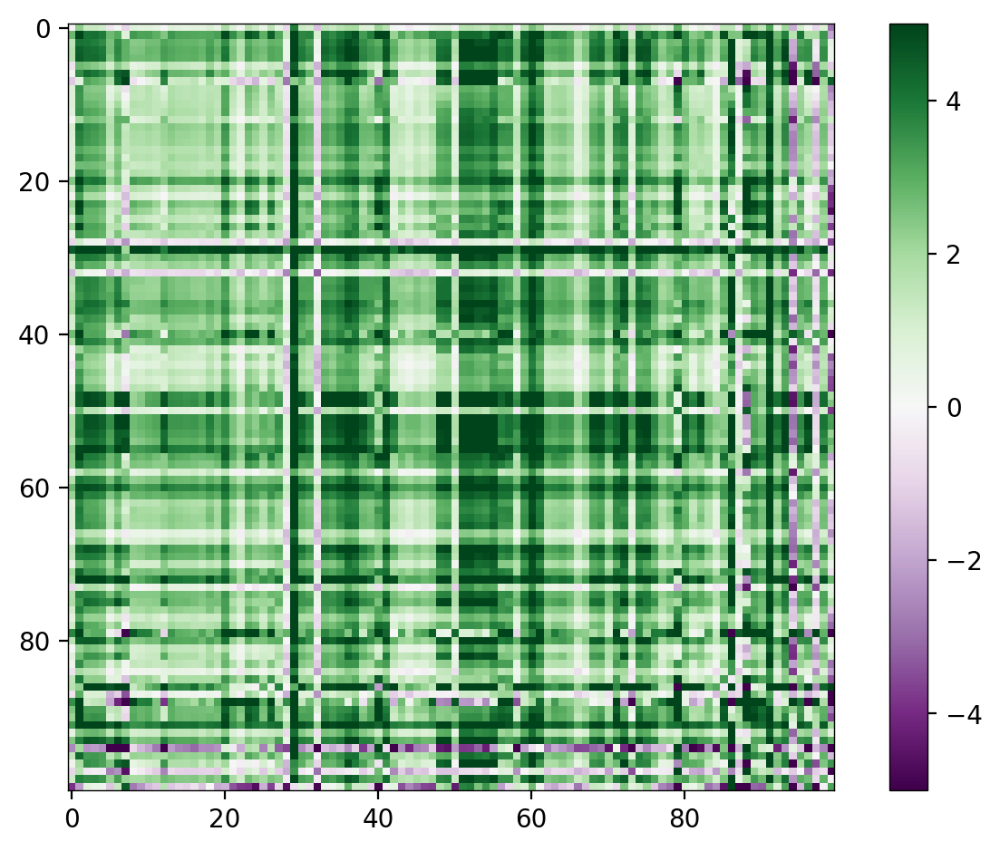

In [41]:
if mode == 'calvados':
    plt.imshow(all_cross_interactions[0:100,0:100], vmin=-15, vmax=15,cmap='PRGn',interpolation='None')
elif mode == 'mpipi':
    plt.imshow(all_cross_interactions[0:100,0:100], vmin=-5, vmax=5,cmap='PRGn',interpolation='None')
plt.colorbar()
plt.tight_layout()
plt.savefig(f'/home/wenyuantong/Desktop/figures/arabi_effector_smol_matrix_{mode}.pdf')

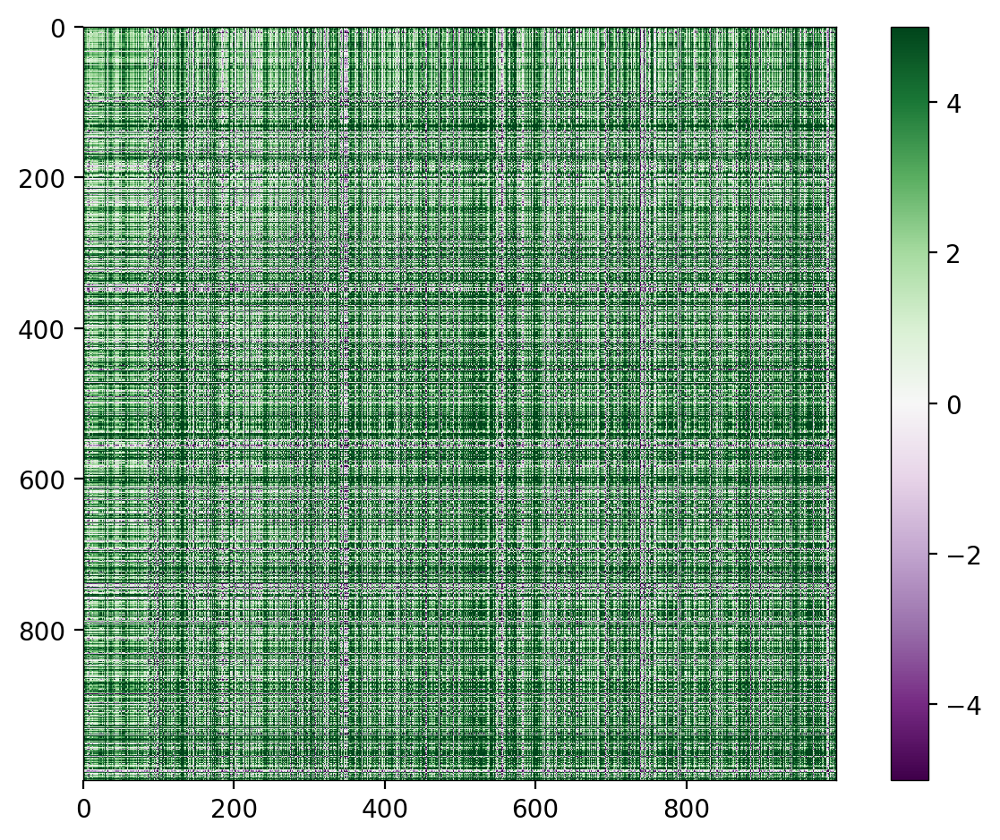

In [42]:
if mode == 'calvados':
    plt.imshow(all_cross_interactions[0:1000,0:1000], vmin=-15, vmax=15,cmap='PRGn',interpolation='None')
elif mode == 'mpipi':
    plt.imshow(all_cross_interactions[0:1000,0:1000], vmin=-5, vmax=5,cmap='PRGn',interpolation='None')

plt.colorbar()
plt.tight_layout()
plt.savefig(f'/home/wenyuantong/Desktop/figures/arabi_effector_medium_matrix_{mode}.pdf')

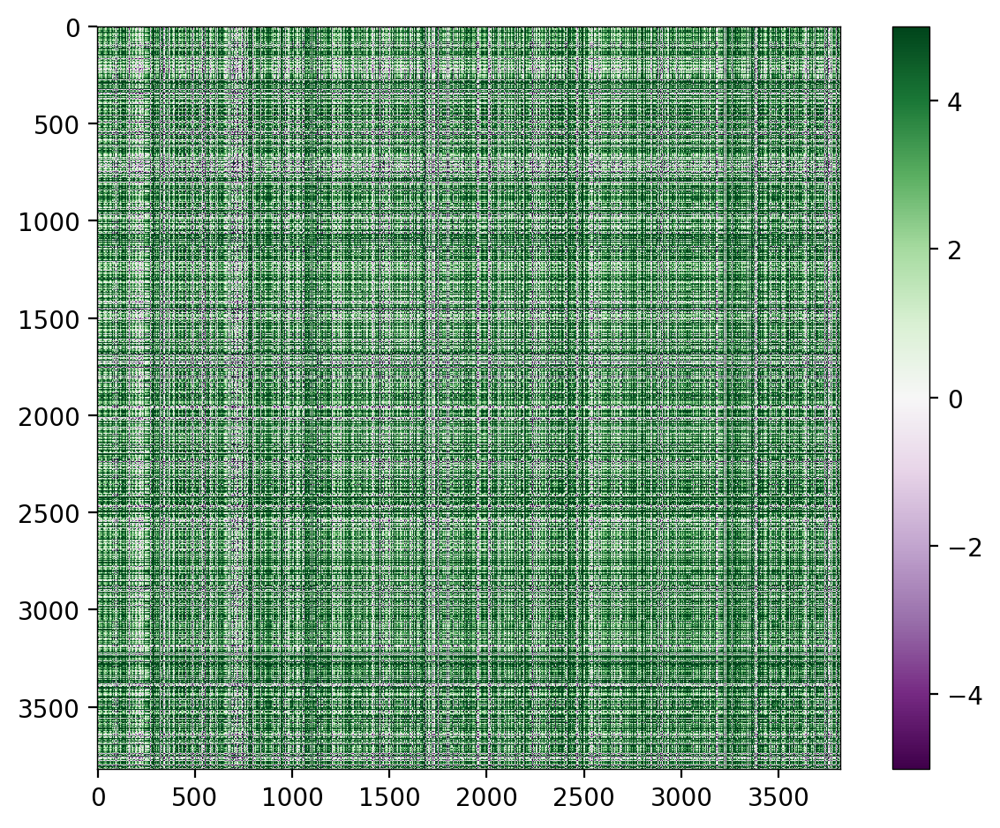

In [43]:
if mode == 'calvados':
    plt.imshow(all_cross_interactions, vmin=-15, vmax=15,cmap='PRGn',interpolation='None')
elif mode == 'mpipi':
    plt.imshow(all_cross_interactions, vmin=-5, vmax=5,cmap='PRGn',interpolation='None')

plt.colorbar()
plt.tight_layout()
plt.savefig(f'/home/wenyuantong/Desktop/figures/arabi_effector_big_matrix_{mode}.pdf')

In [44]:
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list,fcluster
import matplotlib.patches as mpatches

In [45]:
%%time
# calculate the linkage relationships
# NOTE - this takes ~5 min to run because of the optimal_ordering keyword
row_linkage = linkage(all_cross_interactions, method='ward', optimal_ordering=True)
col_linkage = linkage(all_cross_interactions.T, method='ward',optimal_ordering=True)  # Transpose for column clustering
row_order = leaves_list(row_linkage)
col_order = leaves_list(col_linkage)

CPU times: user 22min 41s, sys: 4.69 s, total: 22min 46s
Wall time: 22min 36s


In [46]:
# reorder the matrix based on this set of linkage relationships
reordered_matrix = all_cross_interactions[row_order, :][:, col_order]

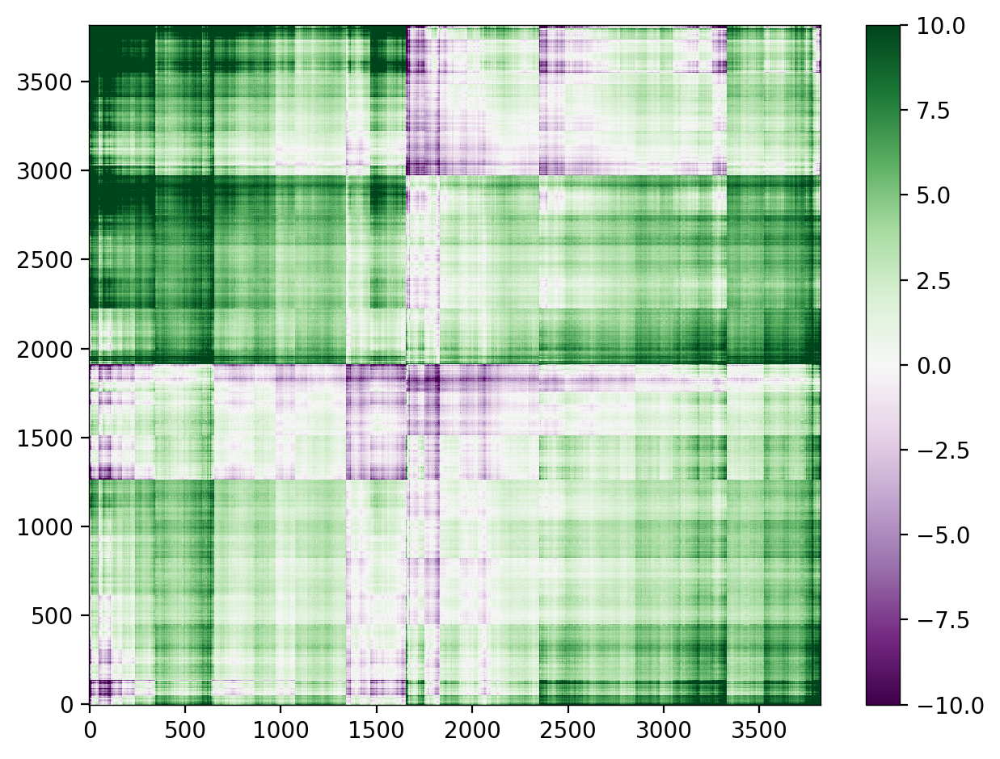

In [47]:
# test-drive simple representation - 
if mode == 'calvados':
    plt.imshow(reordered_matrix, vmin=-25, vmax=25,cmap='PRGn',interpolation='None', aspect='auto', origin='lower')
    plt.colorbar()
    plt.tight_layout()
elif mode == 'mpipi':
    plt.imshow(reordered_matrix, vmin=-10, vmax=10,cmap='PRGn',interpolation='None', aspect='auto', origin='lower')
    plt.colorbar()
    plt.tight_layout()
    

In [48]:
# define the number of clusters (0.5) - so nclusters12 => 24 clusters
nclusters=12

# find nclusters*2 clusters using maxclust
clusters = fcluster(row_linkage, t=nclusters*2, criterion='maxclust')

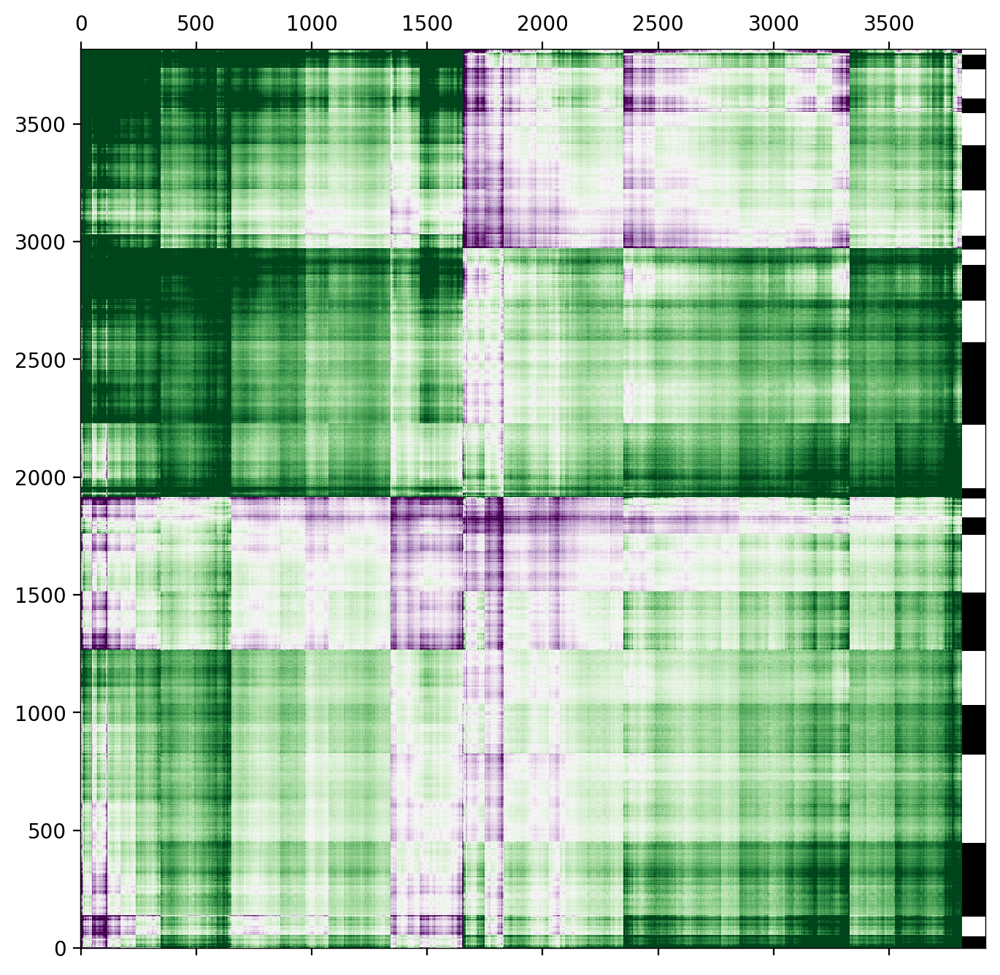

In [50]:
# now plot everything
fig, ax = plt.subplots(figsize=(8, 8))

if mode == 'mpipi':
    cax = ax.matshow(reordered_matrix, aspect='auto', origin='lower', cmap='PRGn', vmin=-8, vmax=8)
elif mode == 'calvados':
    cax = ax.matshow(reordered_matrix, aspect='auto', origin='lower', cmap='PRGn', vmin=-25, vmax=25)

# Add a color bar for the heatmap

# cluster membership sidebar - rather than the chaos of a dendrogram we're gonna alternative white/black to deliniate
# cluster identity

possible_colors = ['k','w']
color_idx = 0

current_cluster = clusters[row_order][0]
current_color = 'k'
color_labels = []
color_labels.append(current_color)

for c in clusters[row_order][1:]:
    if c == current_cluster:
         pass
    else:
        current_cluster = c
        
        if color_idx + 1 == len(possible_colors):
            color_idx = 0
            current_color = possible_colors[color_idx]
        else:
            color_idx = color_idx + 1            
            current_color = possible_colors[color_idx]
        
    color_labels.append(current_color)


#cluster_colors = ['k', 'w']*(nclusters)
#color_labels = [cluster_colors[i-1] for i in clusters[row_order]]  # Match cluster ID to color

for ypos, c in enumerate(color_labels):
    ax.add_patch(mpatches.Rectangle((3818, ypos), 100, 10, color=c, edgecolor=None))

ax.set_xlim(right=reordered_matrix.shape[0]+100)  


plt.savefig(f'/home/wenyuantong/Desktop/figures/arabi_effector_clustered_chemical_space_{mode}.pdf')

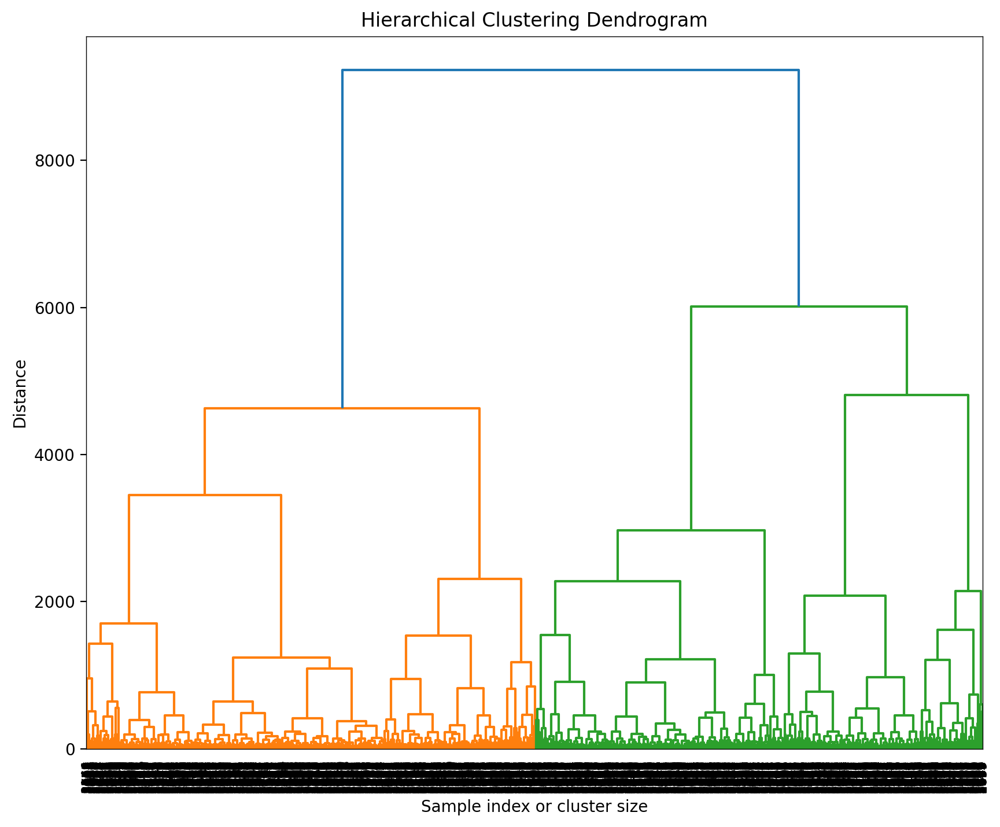

In [51]:
#Z = linkage(X, 'ward')
#row_linkage
#col_linkage

# 3. Plot the dendrogram
plt.figure(figsize=(10, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample index or cluster size')
plt.ylabel('Distance')

dendrogram(
    row_linkage,
    leaf_rotation=90.,  # Rotates the x-axis labels
    leaf_font_size=8.,  # Adjusts the font size for the labels
)

plt.show()

In [53]:
cluster_indices_dict = {}
for index, cluster_id in enumerate(clusters):
    if cluster_id not in cluster_indices_dict:
        cluster_indices_dict[cluster_id] = []
    cluster_indices_dict[cluster_id].append(index)

In [54]:
# define the domains in each cluster (1,2,... from bottom to top)
cluster_domains = {}
for i in range(1, 1+nclusters*2):

    cluster_domains[i] = []
    for idx in cluster_indices_dict[i]:
        cluster_domains[i].append(size_d[idx])

In [55]:
cluster_props = {}
for i in range(1, 1+nclusters*2):
    local_seqs = []
    local_props = []
    for d in cluster_domains[i]:
        local_seqs.append(Protein(d.sequence))

    local_props.append(len(local_seqs))
    local_props.append([round(p.NCPR,4) for p in local_seqs])
    local_props.append([round(p.FCR,4) for p in local_seqs])
    local_props.append([round(p.fraction_aliphatic,4) for p in local_seqs])
    local_props.append([round(p.fraction_aromatic,4) for p in local_seqs])
    local_props.append([round(p.fraction_negative,4) for p in local_seqs])
    local_props.append([round(p.fraction_positive,4) for p in local_seqs])
    local_props.append([round(p.fraction_polar,4) for p in local_seqs])
    local_props.append([round(p.fraction_proline,4) for p in local_seqs])
    #local_props.append([round(p.kappa,4) for p in local_seqs])
    
    cluster_props[i] = [round(np.mean(p),4) for p in local_props]

In [56]:
# write out cluster info

with open(f'/home/wenyuantong/Desktop/data/arabi_effector_average_cluster_properties_{mode}.csv','w') as fh:
    fh.write('Cluster, Prot. count, NCPR, FCR, f_ali, f_aro, f_neg, f_pos, f_pol, f_pro\n')
    for k in cluster_props:
        fh.write(str(k) + ", " + ", ".join([str(i) for i in cluster_props[k]]) + "\n")
      

In [57]:
cluster_fasta = {}
for i in range(1, 1+nclusters*2):
    for d in cluster_domains[i]:
        name = f"CLUSTER_{i} | {d.protein.name} | START={d.start}  END={d.end}"
        seq = d.sequence
        cluster_fasta[name] = seq
        
protfasta.write_fasta(cluster_fasta, f'/home/wenyuantong/Desktop/data/arabi_effector_clustered_idrs_{mode}.fasta')  

In [58]:
with open(f'/home/wenyuantong/Desktop/data/arabi_effector_heterotypic_clusers_{mode}.csv','w') as fh:
    idx = 0
    fh.write(f"index, UniProt ID, name, cluster, idr_start, idr_end, sequence\n")
    for i in range(1, 1+nclusters*2):
        for d in cluster_domains[i]:
            idx = idx + 1
            safename = d.protein.name.replace(',',';')
            fh.write(f"{idx}, {d.protein.unique_ID}, {safename}, {i}, {d.start}, {d.end}, {d.sequence}\n")

In [60]:
#all_cross_interactions
all_atr_interactions = []
attractive = 0
repulsive = 0
for k1 in cross_interaction:
    tmp = []
    for k2 in cross_interaction:
        tmp.append(cross_interaction[k1][k2])
        if cross_interaction[k1][k2] < 0:
            attractive = attractive+1
            all_atr_interactions.append([k1,k2,(cross_interaction[k1][k2])])
            
        else:
            repulsive = repulsive + 1
    #all_cross_interactions.append(tmp)
#all_cross_interactions = np.array(all_cross_interactions)

In [62]:
import pandas as pd

In [63]:
#all_atr_interactions
atr_df = pd.DataFrame(all_atr_interactions, columns=['IDR1', 'IDR2','E_value'])

# Display the DataFrame
display(atr_df)

,IDR1,IDR2,E_value
0,AvrRpm1d_N-terminal_1_100,AvrRpm1d_N-terminal_1_100,-0.099344
1,AvrRpm1d_N-terminal_1_100,HopI1e_Middle_180_300,-0.466960
2,AvrRpm1d_N-terminal_1_100,HopI1p_C-terminal_178_308,-0.920477
3,AvrRpm1d_N-terminal_1_100,HopAT1o_N-terminal_1_106,-0.826561
4,AvrRpm1d_N-terminal_1_100,AvrB2g_N-terminal_1_111,-1.394889
...,...,...,...
2377231,Q9XFB0_N-terminal_1_115,Q9LTC6_IDP_1_139,-0.960064
2377232,Q9XFB0_N-terminal_1_115,O49403_N-terminal_1_120,-1.110220
2377233,Q9XFB0_N-terminal_1_115,O64824_C-terminal_84_227,-1.652534
2377234,Q9XFB0_N-terminal_1_115,P92513_IDP_1_107,-0.240161


In [66]:
#cross_interaction[77:]
#eff_arabi_interactions = all_cross_interactions[77:,0:77]

In [70]:
#eff_arabi_interactions

In [73]:
eff_df = pd.read_csv('/home/wenyuantong/Desktop/data/IDR_psytec_domain.tsv',  sep='\t', header=None)
display(eff_df.head())

,0,1,2,3
0,HopX1a,1,88,N-terminal
1,HopX1a,200,247,Middle
2,HopX1a,298,380,C-terminal
3,HopX1c,1,87,N-terminal
4,HopX1c,212,267,Middle


In [76]:
eff_df[0] = eff_df[0].str.replace(' ', '')
substrings_to_find = eff_df[0].tolist()
display(substrings_to_find[:10])

['HopX1a',
 'HopX1a',
 'HopX1a',
 'HopX1c',
 'HopX1c',
 'HopX1b',
 'HopX1b',
 'HopX1i',
 'HopX1i',
 'HopX1e']

In [77]:
# Combine the substrings into a single regex pattern using '|' (OR operator)
# This pattern will match if any of the substrings are found.
search_pattern = '|'.join(substrings_to_find)

# Filter the original DataFrame
# The `case=False` argument makes the search case-insensitive
# The `na=False` argument treats NaN values as not containing the substring
sub_df_multi = atr_df[atr_df['IDR1'].str.contains(search_pattern, case=False, na=False)]

#print(f"\nSub-DataFrame containing any of the terms: {substrings_to_find} in 'item_description' column:")
display(sub_df_multi)


Sub-DataFrame containing any of the terms: ['HopX1a', 'HopX1a', 'HopX1a', 'HopX1c', 'HopX1c', 'HopX1b', 'HopX1b', 'HopX1i', 'HopX1i', 'HopX1e', 'HopX1d', 'HopX1d', 'HopX1g', 'HopX1g', 'HopBO1c', 'HopBO1c', 'HopBO1b', 'HopBO1b', 'HopBO1a', 'HopBO1a', 'HopBO1d', 'HopBO1d', 'AvrRpm1a', 'AvrRpm1h', 'AvrRpm1d', 'AvrRpm1e', 'AvrRpm1f', 'AvrRpm1i', 'HopO1h', 'HopO1h', 'HopD1d', 'HopD1d', 'HopD1a', 'HopD1a', 'HopD1e', 'HopD1c', 'HopB1a', 'HopB1d', 'HopB1b', 'HopI1c', 'HopI1e', 'HopI1g', 'HopI1o', 'HopI1l', 'HopI1n', 'HopI1d', 'HopI1a', 'HopI1b', 'HopI1j', 'HopI1f', 'HopI1h', 'HopI1p', 'HopG1a', 'HopG1b', 'HopG1c', 'HopQ1b', 'HopQ1a', 'HopAI1a', 'HopAI1b', 'HopAI1d', 'HopAI1g', 'HopAI1c', 'HopAI1m', 'HopAI1k', 'AvrPto1f', 'AvrPto1d', 'AvrPto1m', 'AvrPto1k', 'AvrPto1e', 'AvrPto1i', 'AvrPto1h', 'AvrPto1c', 'AvrPto1l', 'AvrPto1a', 'AvrPto1b', 'HopZ1m', 'HopZ1m', 'HopZ1g', 'HopZ1g', 'HopZ1a', 'HopZ1a', 'HopZ1e', 'HopAB1r', 'HopAB1r', 'HopAB1r', 'HopAB1r', 'HopAB1i', 'HopAB1i', 'HopAB1i', 'HopAB1s'

,IDR1,IDR2,E_value
0,AvrRpm1d_N-terminal_1_100,AvrRpm1d_N-terminal_1_100,-0.099344
1,AvrRpm1d_N-terminal_1_100,HopI1e_Middle_180_300,-0.466960
2,AvrRpm1d_N-terminal_1_100,HopI1p_C-terminal_178_308,-0.920477
3,AvrRpm1d_N-terminal_1_100,HopAT1o_N-terminal_1_106,-0.826561
4,AvrRpm1d_N-terminal_1_100,AvrB2g_N-terminal_1_111,-1.394889
...,...,...,...
35849,HopZ1h_C-terminal_247_369,O49403_N-terminal_1_120,-1.920291
35850,HopZ1h_C-terminal_247_369,O64824_C-terminal_84_227,-2.766253
35851,HopZ1h_C-terminal_247_369,P92513_IDP_1_107,-0.582183
35852,HopZ1h_C-terminal_247_369,Q1G3B3_IDP_1_113,-1.649951


In [79]:
sub_df_not_containing = sub_df_multi[~sub_df_multi['IDR2'].str.contains(search_pattern, case=False, na=False)]

#print(f"\nSub-DataFrame containing rows that *do not* contain any of the terms in '{search_pattern}' in 'item_description' column:")
display(sub_df_not_containing)

,IDR1,IDR2,E_value
11,AvrRpm1d_N-terminal_1_100,Q9LNP6_C-terminal_213_328,-0.496718
12,AvrRpm1d_N-terminal_1_100,Q9SCU5_C-terminal_406_549,-0.338891
13,AvrRpm1d_N-terminal_1_100,Q8L649_N-terminal_1_147,-1.719397
14,AvrRpm1d_N-terminal_1_100,Q9FVQ5_C-terminal_701_806,-0.879909
15,AvrRpm1d_N-terminal_1_100,Q9SJA6_C-terminal_64_196,-2.919727
...,...,...,...
35849,HopZ1h_C-terminal_247_369,O49403_N-terminal_1_120,-1.920291
35850,HopZ1h_C-terminal_247_369,O64824_C-terminal_84_227,-2.766253
35851,HopZ1h_C-terminal_247_369,P92513_IDP_1_107,-0.582183
35852,HopZ1h_C-terminal_247_369,Q1G3B3_IDP_1_113,-1.649951


In [80]:
sorted_df_ascending = sub_df_not_containing.sort_values(by='E_value', ascending=True)

print("\nDataFrame sorted by 'price' (smallest to largest):")
display(sorted_df_ascending)


DataFrame sorted by 'price' (smallest to largest):


,IDR1,IDR2,E_value
4258,HopI1p_C-terminal_178_308,A0A178VM97_IDP_1_146,-24.740424
4098,HopI1p_C-terminal_178_308,Q9FFP0_N-terminal_1_143,-23.083605
4137,HopI1p_C-terminal_178_308,A0A178UWL0_C-terminal_436_541,-21.028572
4638,HopI1p_C-terminal_178_308,Q9ASP6_N-terminal_1_103,-20.506545
4071,HopI1p_C-terminal_178_308,Q8GYP3_C-terminal_203_346,-19.615259
...,...,...,...
35840,HopZ1h_C-terminal_247_369,A0A1P8AQV3_middle_41_150,-0.000204
19145,HopY1c_Middle_106_221,Q84JA6_middle_75_202,-0.000168
22374,HopBP1c_N-terminal_1_130,Q9SG82_N-terminal_1_106,-0.000118
20305,HopAU1a_C-terminal_614_731,F4IST2_middle_118_232,-0.000079


In [82]:
pd.set_option('display.max_rows', 100)
display(sorted_df_ascending[:100])

,IDR1,IDR2,E_value
4258,HopI1p_C-terminal_178_308,A0A178VM97_IDP_1_146,-24.740424
4098,HopI1p_C-terminal_178_308,Q9FFP0_N-terminal_1_143,-23.083605
4137,HopI1p_C-terminal_178_308,A0A178UWL0_C-terminal_436_541,-21.028572
4638,HopI1p_C-terminal_178_308,Q9ASP6_N-terminal_1_103,-20.506545
4071,HopI1p_C-terminal_178_308,Q8GYP3_C-terminal_203_346,-19.615259
3334,HopI1p_C-terminal_178_308,Q7XA71_C-terminal_50_177,-19.479794
4664,HopI1p_C-terminal_178_308,Q9M086_C-terminal_1753_1883,-19.455978
4052,HopI1p_C-terminal_178_308,F4JG98_N-terminal_1_124,-18.383254
3586,HopI1p_C-terminal_178_308,Q9LVG1_middle_118_230,-17.609820
4607,HopI1p_C-terminal_178_308,Q9C6G8_middle_92_201,-17.391186


In [95]:
#atr_df 
substring_to_find = 'A0A178VM97'

sub_df1 = atr_df[atr_df['IDR2'].str.contains(substring_to_find, case=False, na=False)]

print(f"\nSub-DataFrame containing '{substring_to_find}' in 'IDR2' column:")
display(sub_df1)


Sub-DataFrame containing 'A0A178VM97' in 'IDR2' column:


,IDR1,IDR2,E_value
532,AvrRpm1d_N-terminal_1_100,A0A178VM97_IDP_1_146,-1.933858
1033,HopB1a_N-terminal_1_121,A0A178VM97_IDP_1_146,-6.266735
1239,HopB1d_N-terminal_1_131,A0A178VM97_IDP_1_146,-6.236852
1470,HopB1b_N-terminal_1_139,A0A178VM97_IDP_1_146,-6.542088
2166,HopI1e_Middle_180_300,A0A178VM97_IDP_1_146,-10.331058
...,...,...,...
2370541,Q9C9J1_N-terminal_1_100,A0A178VM97_IDP_1_146,-6.184955
2373724,Q9FMK8_IDP_1_138,A0A178VM97_IDP_1_146,-11.222945
2376011,Q8VY68_IDP_1_113,A0A178VM97_IDP_1_146,-10.108670
2376681,Q9SZD3_IDP_1_115,A0A178VM97_IDP_1_146,-3.015017


In [96]:
sub_df_sort = sub_df1.sort_values(by='E_value', ascending=True)

print("\nDataFrame sorted by 'E-value' (smallest to largest):")
display(sub_df_sort)


DataFrame sorted by 'E-value' (smallest to largest):


,IDR1,IDR2,E_value
1358179,P26568_C-terminal_127_274,A0A178VM97_IDP_1_146,-39.915964
290255,Q9LHP2_C-terminal_117_262,A0A178VM97_IDP_1_146,-39.606453
479640,P26569_C-terminal_129_273,A0A178VM97_IDP_1_146,-38.540439
453566,P0CB26_N-terminal_1_120,A0A178VM97_IDP_1_146,-37.828117
559407,A2RVS6_C-terminal_197_300,A0A178VM97_IDP_1_146,-33.742364
...,...,...,...
711285,O81740_N-terminal_1_125,A0A178VM97_IDP_1_146,-0.023321
1981558,Q9SRZ7_middle_131_254,A0A178VM97_IDP_1_146,-0.014196
806663,Q9LV89_C-terminal_46_171,A0A178VM97_IDP_1_146,-0.013020
1285469,A0A1P8AUX0_IDP_1_113,A0A178VM97_IDP_1_146,-0.010743


In [92]:
pd.set_option('display.max_rows', 100)
display(sub_df_sort[:100])

,IDR1,IDR2,E_value
1358179,P26568_C-terminal_127_274,A0A178VM97_IDP_1_146,-39.915964
290255,Q9LHP2_C-terminal_117_262,A0A178VM97_IDP_1_146,-39.606453
479640,P26569_C-terminal_129_273,A0A178VM97_IDP_1_146,-38.540439
453566,P0CB26_N-terminal_1_120,A0A178VM97_IDP_1_146,-37.828117
559407,A2RVS6_C-terminal_197_300,A0A178VM97_IDP_1_146,-33.742364
55521,O22315_C-terminal_194_303,A0A178VM97_IDP_1_146,-32.500571
551153,F4IJY5_IDP_1_104,A0A178VM97_IDP_1_146,-32.350361
1589526,O81127_C-terminal_70_187,A0A178VM97_IDP_1_146,-31.600733
1294540,Q9FLI5_N-terminal_1_142,A0A178VM97_IDP_1_146,-31.052313
196293,O81126_C-terminal_65_200,A0A178VM97_IDP_1_146,-30.949914


In [94]:
top_100_cross = sorted_df_ascending[:100]

substring_to_find = 'HopI1p'

sub_df = top_100_cross[top_100_cross['IDR1'].str.contains(substring_to_find, case=False, na=False)]

print(f"\nSub-DataFrame containing '{substring_to_find}' in 'item_description' column:")
display(sub_df.shape)


Sub-DataFrame containing 'HopI1p' in 'item_description' column:


(75, 3)

In [100]:
#sorted_df_ascending
substring_to_find = 'A0A178VM97'

sub_df = sorted_df_ascending[sorted_df_ascending['IDR2'].str.contains(substring_to_find, case=False, na=False)]
display(sub_df.shape)

(68, 3)